# Color Drum Machine: Creative Coding with SMK API

This notebook demonstrates a creative use of the [National Gallery of Denmark's API (SMK API)](https://www.smk.dk/article/smk-api/) to generate both a flashing GIF and a drum beat (as a MIDI file) from the color palette and thumbnail of an artwork.

It is mainly created using [Cursor - The AI Code Editor](https://cursor.com/) to demonstrate the creative use of AI in building small scripts at [HACK4DK 2025](https://hack4.dk/).

You simply provide an artwork's object number, and the notebook will:
- Fetch the artwork's color palette and thumbnail from the SMK API
- Create a blinking/flashing GIF from the thumbnail
- Generate a drum pattern from the color palette and save it as a MIDI file

---

## User Control Panel

Change the settings below to experiment with different artworks, tempos, and pattern lengths.
- `object_number`: The SMK object number for the artwork (see [SMK API docs](https://www.smk.dk/article/smk-api/))
- `bpm`: Tempo for the drum pattern
- `pattern_length`: Number of steps in the drum pattern


In [61]:
# --- User Control Panel ---
object_number = 'kms1'  # Change to any valid SMK object number
bpm = 360                   # Beats per minute for the drum pattern
pattern_length = 32         # Number of steps in the drum pattern


## 1. Setup and Imports
Install and import all necessary libraries.


In [62]:
# Uncomment the line below if running for the first time
# !pip install mido imageio pillow pygame seaborn requests

import requests
import pandas as pd
import json
import matplotlib.pyplot as plt
import seaborn as sns
from io import BytesIO
from PIL import Image
import imageio
import random
import mido
import colorsys
from itertools import cycle
import re


## 2. Fetch Artwork Data from SMK API
This cell fetches the color palette, thumbnail, and title for the selected artwork using the SMK API.


In [63]:
# Define the API URL
api_url = f'https://api.smk.dk/api/v1/art/?object_number={object_number}'

# Fetch the data from the API
response = requests.get(api_url)
response.raise_for_status()  # Ensure request was successful
data = response.json()

# Extract hex color palette, thumbnail, and title
hex_colors = data['items'][0]['colors']
thumbnail = data['items'][0]['image_thumbnail']
title = data['items'][0]['titles'][0]['title']
title = ' '.join(re.findall(r'\b\S+\b', title))

print(f'Artwork title: {title}')
print(f'Palette: {hex_colors}')
print(f'Thumbnail URL: {thumbnail}')

Artwork title: Titanernes fald
Palette: ['#222222', '#230b09', '#170e06', '#ec6449', '#fcaa6b', '#b97438', '#77733d', '#956830', '#593d1c']
Thumbnail URL: https://iip-thumb.smk.dk/iiif/jp2/9g54xm869_KMS1-cropped.tif.jp2/full/!1024,/0/default.jpg


## 3. Create Blinking/Flashing GIF from Thumbnail
This cell creates a GIF by overlaying different colors on the artwork's thumbnail.


In [64]:
# Download the image
response = requests.get(thumbnail)
img = Image.open(BytesIO(response.content)).convert('RGB')

# Define overlay colors for flashing
overlay_colors = [
    (255, 0, 0),    # Red
    (0, 255, 0),    # Green
    (0, 0, 255),    # Blue
    (255, 255, 0),  # Yellow
    (255, 255, 255),# White (flash)
    (0, 0, 0),      # Black (blink)
]

frames = []
for color in overlay_colors * 3:  # Repeat to make the GIF longer
    overlay = Image.new('RGB', img.size, color)
    blended = Image.blend(img, overlay, alpha=0.5)
    frames.append(blended)

gif_filename = f'blinking_flash_{title}.gif'
frames[0].save(
    gif_filename,
    save_all=True,
    append_images=frames[1:],
    duration=150,  # ms per frame
    loop=0
)
print(f'GIF saved as {gif_filename}')

GIF saved as blinking_flash_Titanernes fald.gif


## 4. Map Colors to Drums
This cell defines the functions for mapping colors to drum sounds based on brightness, and creates the drum mapping for the current palette.


In [65]:
def hex_to_brightness(hex_color):
    hex_color = hex_color.lstrip('#')
    r, g, b = tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))
    return 0.299 * r + 0.587 * g + 0.114 * b

def map_colors_to_drums(hex_colors):
    n = len(hex_colors)
    if n == 0:
        return {}
    brightness = [(color, hex_to_brightness(color)) for color in hex_colors]
    brightness.sort(key=lambda x: x[1])
    sorted_colors = [item[0] for item in brightness]
    drum_mapping = {}
    kicks = [('kick', 36)]
    snares_toms = [('snare', 38), ('tom', 45), ('tom', 47), ('tom', 41)]
    hihats = [('hihat_closed', 42), ('hihat_open', 46), ('hihat_pedal', 44)]
    from itertools import cycle
    if n == 1:
        drum_mapping[sorted_colors[0]] = kicks[0]
        return drum_mapping
    kick_boundary = max(1, n // 3)
    hihat_start_index = n - max(1, n // 3)
    kick_colors = sorted_colors[:kick_boundary]
    snare_tom_colors = sorted_colors[kick_boundary:hihat_start_index]
    hihat_colors = sorted_colors[hihat_start_index:]
    kick_cycle = cycle(kicks)
    for color in kick_colors:
        drum_mapping[color] = next(kick_cycle)
    snare_tom_cycle = cycle(snares_toms)
    for color in snare_tom_colors:
        drum_mapping[color] = next(snare_tom_cycle)
    hihat_cycle = cycle(hihats)
    for color in hihat_colors:
        drum_mapping[color] = next(hihat_cycle)
    return drum_mapping

drum_mapping = map_colors_to_drums(hex_colors)
print('Drum mapping:')
for color, drum in drum_mapping.items():
    print(f'{color} -> {drum[0]}')

Drum mapping:
#170e06 -> kick
#230b09 -> kick
#222222 -> kick
#593d1c -> snare
#77733d -> tom
#956830 -> tom
#b97438 -> hihat_closed
#ec6449 -> hihat_open
#fcaa6b -> hihat_pedal


## 5. Generate Drum Pattern and Save as MIDI
This cell generates a drum pattern from the color palette and saves it as a MIDI file.


In [66]:
def get_luminance(hex_color):
    hex_color = hex_color.lstrip('#')
    r, g, b = tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))
    return 0.2126*r + 0.7152*g + 0.0722*b

def get_hue(hex_color):
    hex_color = hex_color.lstrip('#')
    r, g, b = tuple(int(hex_color[i:i+2], 16)/255.0 for i in (0, 2, 4))
    h, l, s = colorsys.rgb_to_hls(r, g, b)
    return h

mid = mido.MidiFile()
track = mido.MidiTrack()
mid.tracks.append(track)
microseconds_per_beat = int(60000000 / bpm)
track.append(mido.MetaMessage('set_tempo', tempo=microseconds_per_beat, time=0))
pattern = []
for step in range(pattern_length):
    if random.random() < 0.2:
        pattern.append(None)
    else:
        index = random.randint(0, len(hex_colors) - 1)
        pattern.append(index)
def add_drum_hit(track, color, velocity, absolute_time, variation=0, last_time=[0], swing=False):
    if color not in drum_mapping:
        print(f'Warning: Color {color} not in drum_mapping, skipping.')
        return
    pitch = drum_mapping[color][1]
    channel = 9  # percussion
    time_variation = int(random.uniform(-5, 5))
    message_time = absolute_time + variation + time_variation
    if message_time < 0:
        message_time = 0s
    delta_time = message_time - last_time[0]
    if delta_time < 0:
        delta_time = 0
    last_time[0] = message_time
    if swing:
        if (absolute_time // 480) % 2 == 1:
            delta_time += 20  # slight delay for shuffle
    msg_on = mido.Message('note_on', note=pitch, velocity=velocity, time=delta_time, channel=channel)
    msg_off = mido.Message('note_off', note=pitch, velocity=0, time=60, channel=channel)
    track.append(msg_on)
    track.append(msg_off)
last_message_time = [0]
base_time = 0
for step_idx, index in enumerate(pattern):
    if index is None:
        base_time += int(480 * 1)  # rest
        continue
    color = hex_colors[index]
    luminance = get_luminance(color)
    hue = get_hue(color)
    base_velocity = int(max(20, min(127, luminance)))
    if hue < 0.33:
        velocity = int(min(127, base_velocity + 20))
    elif hue < 0.66:
        velocity = int(min(127, base_velocity + 10))
    else:
        velocity = int(min(127, base_velocity))
    swing = True if step_idx % 4 != 0 else False
    variation = random.randint(-10, 10)
    add_drum_hit(track, color, velocity, base_time, variation=variation, last_time=last_message_time, swing=swing)
    if swing:
        base_time += int(480 * 0.9583)
    else:
        base_time += 480
midi_filename = f'groovy_drum_and_bass_{title}.mid'
mid.save(midi_filename)
print(f'MIDI file saved as {midi_filename}')

MIDI file saved as groovy_drum_and_bass_Titanernes fald.mid


## 6. Display GIF and Play MIDI File
This cell displays the generated GIF and plays the MIDI file in a loop. (Note: MIDI playback requires a local soundfont and may not work in all notebook environments.)


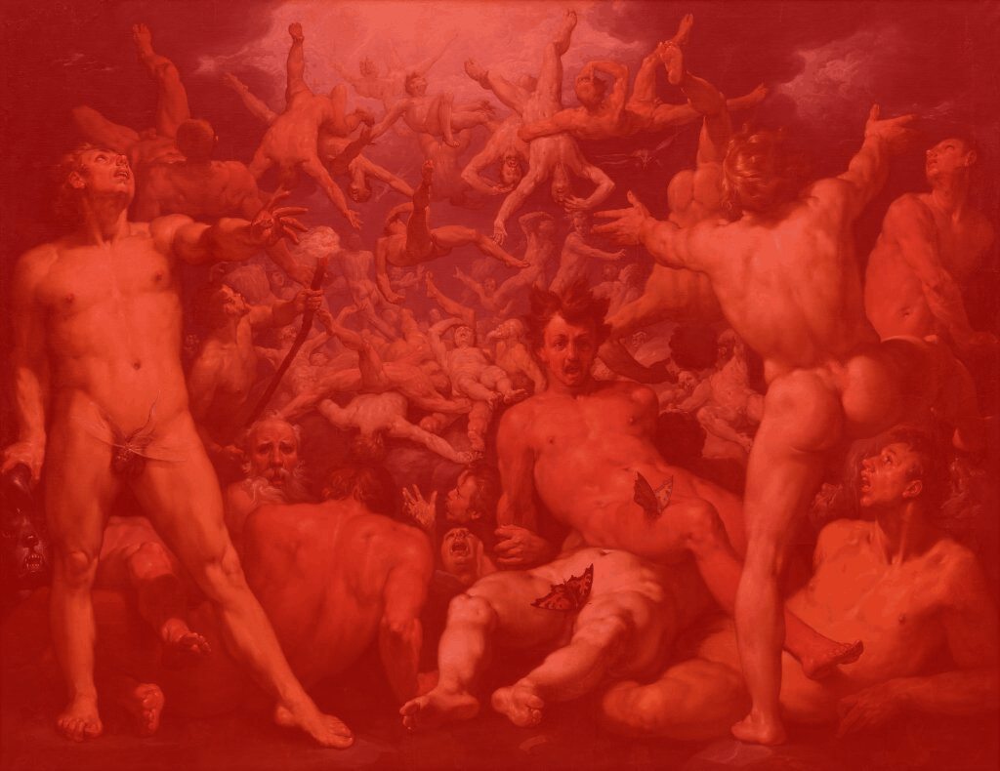

Playing groovy_drum_and_bass_Titanernes fald.mid on a loop. Press Ctrl+C to stop.
Playback stopped.


In [67]:
from IPython.display import Image, display
display(Image(gif_filename))

import pygame
import time
pygame.mixer.init()
pygame.mixer.music.load(midi_filename)
pygame.mixer.music.play(loops=-1)
print(f'Playing {midi_filename} on a loop. Press Ctrl+C to stop.')
try:
    while True:
        time.sleep(1)
except KeyboardInterrupt:
    pygame.mixer.music.stop()
    print('Playback stopped.')